Teste 1 - Pegando dado a partir do export record do waveforms

In [2]:
import csv
import matplotlib.pyplot as plt

# Caminho para o arquivo CSV
caminho_arquivo = r"G:\Meu Drive\MESTRADO CPGEI\Lactec\acq0002.csv"

# Lista para armazenar os dados
dados = []

# Lendo os dados do arquivo CSV a partir da linha 11
with open(caminho_arquivo, 'r') as arquivo_csv:
    leitor_csv = csv.reader(arquivo_csv)
    for _ in range(10):  # Descartando as 10 primeiras linhas
        next(leitor_csv)
    for linha in leitor_csv:
        tempo, valor = linha
        dados.append(float(valor))

# Limitando o tamanho de y de 0 a 4095
dados_limitados = [min(max(valor, 0), 4095) for valor in dados]

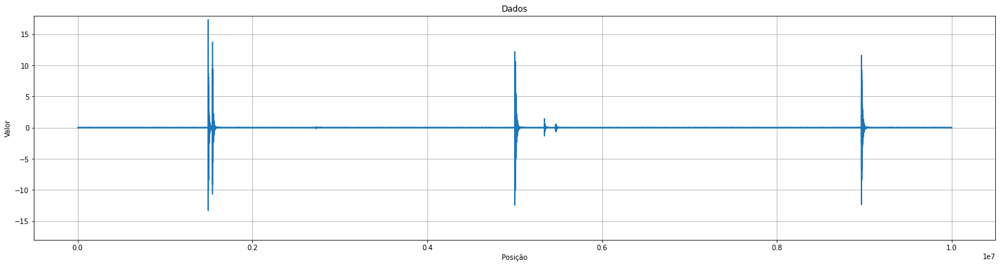

In [21]:
# Cria uma figura com dimensões maiores
plt.figure(figsize=(25, 6))  # Ajuste os valores de largura e altura conforme necessário
plt.plot(dados[0:10000000], linestyle='-')
plt.xlabel('Posição')
plt.ylabel('Valor')
plt.title('Dados')
plt.grid(True)  # Adiciona uma grade para melhor visualização
plt.ylim(-18, 18)  # Limitando o eixo y de -10 a 10
plt.show()

In [53]:
import csv
import matplotlib.pyplot as plt
import numpy as np

# Caminho para o arquivo CSV
caminho_arquivo = r"G:\Meu Drive\MESTRADO CPGEI\Lactec\acq0002.csv"

# Lista para armazenar os dados
dados = []

# Lendo os dados do arquivo CSV a partir da linha 11
with open(caminho_arquivo, 'r') as arquivo_csv:
    leitor_csv = csv.reader(arquivo_csv)
    for _ in range(10):  # Descartando as 10 primeiras linhas
        next(leitor_csv)
    for linha in leitor_csv:
        tempo, valor = linha
        dados.append(float(valor))

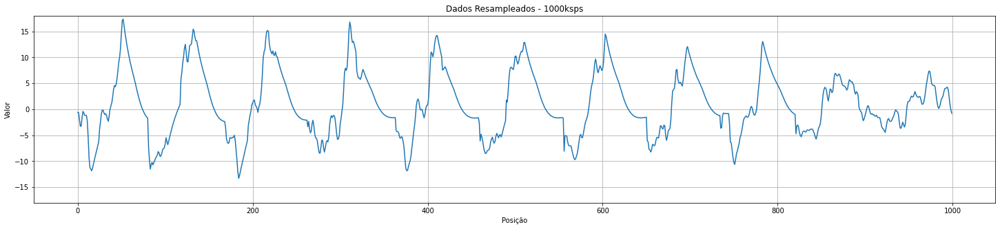

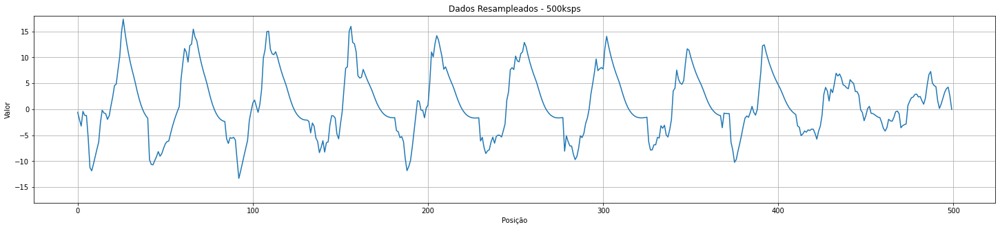

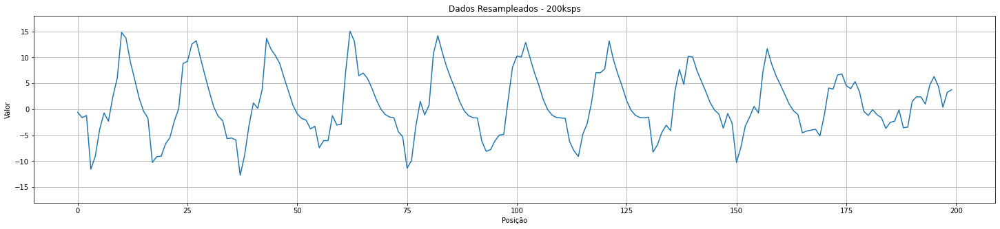

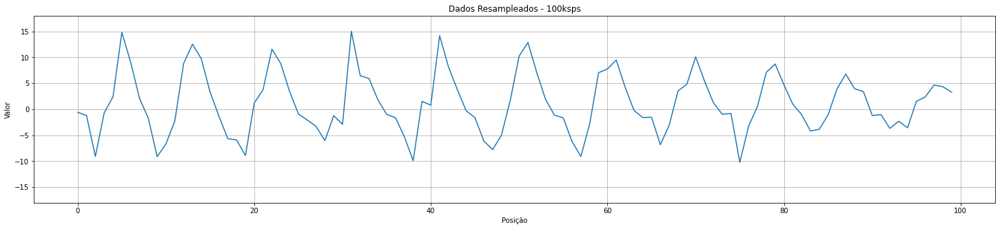

In [55]:
# Frequências de amostragem desejadas
frequencias_amostragem = [1000000, 500000, 200000, 100000]  # 500ksps, 200ksps, 100ksps

inicio = 1494000
fim = 1495000

for freq_amostragem in frequencias_amostragem:
    resampled_data = np.array(dados)[::int(1000000 / freq_amostragem)]

    x_inicio = 0
    if inicio != 0:
        x_inicio = int(freq_amostragem * inicio / 1000000)  # Calcula o índice de início
    x_fim = int(freq_amostragem * fim / 1000000)  # Calcula o índice de fim

    plt.figure(figsize=(25, 5))
    plt.plot(resampled_data[x_inicio:x_fim], linestyle='-')  # Usando os índices de fatia corretos
    plt.xlabel('Posição')
    plt.ylabel('Valor')
    plt.title(f'Dados Resampleados - {freq_amostragem // 1000}ksps')
    plt.grid(True)
    plt.ylim(-18, 18)
    plt.show()

Teste 2 - Pegando dado direto do osciloscópio (https://pypi.org/project/dwfpy/)

In [2]:
import matplotlib.pyplot as plt
import dwfpy as dwf

print(f'DWF Version: {dwf.Application.get_version()}')


with dwf.AnalogDiscovery2() as device:
    print(f'Found device: {device.name} ({device.serial_number})')

    scope = device.analog_input

    print("Starting oscilloscope...")
    scope[0].setup(range=30)
    scope[1].setup(range=30)
    scope.setup_edge_trigger(
        mode='auto', channel=0, slope='rising', level=0, hysteresis=0, position=0
    )
    recorder = scope.record(sample_rate=1e6, length=10, configure=True, start=True)

    if recorder.lost_samples > 0:
        print('Samples lost, reduce sample rate.')
    if recorder.corrupted_samples > 0:
        print('Samples corrupted, reduce sample rate.')

    print(
        f'Processed {recorder.total_samples} samples total, '
        f'received {len(recorder.channels[0].data_samples)} samples.'
    )

DWF Version: 3.20.28
Found device: Analog Discovery 2 (210321A1A084)
Starting oscilloscope...
Processed 10000000 samples total, received 10000000 samples.


Tamanho:10000000
Máximo:0.0015321278689439774
Mínimo:-0.08647805139031009


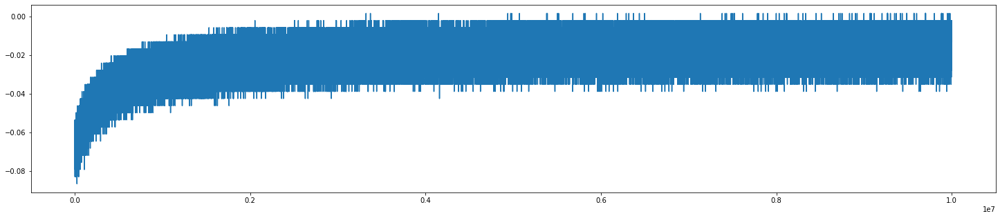

Tamanho:10000000
Máximo:0.006549425866591802
Mínimo:-0.08344194255254969


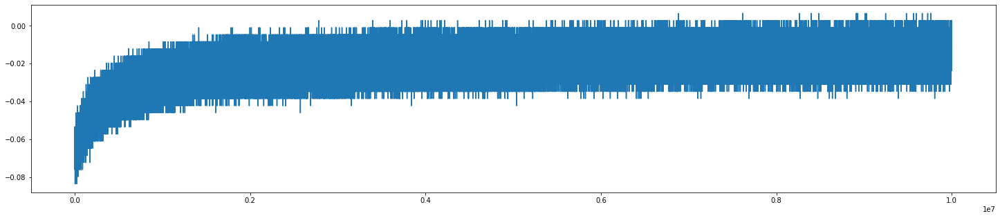

In [3]:
print('Tamanho:' + str(len(recorder.channels[0].data_samples)))
print('Máximo:' + str(max(recorder.channels[0].data_samples)))
print('Mínimo:' + str(min(recorder.channels[0].data_samples)))
plt.figure(figsize=(25, 5))
plt.plot(recorder.channels[0].data_samples, linestyle='-')
# plt.xlim(4000000, 5000000)
plt.show()

print('Tamanho:' + str(len(recorder.channels[1].data_samples)))
print('Máximo:' + str(max(recorder.channels[1].data_samples)))
print('Mínimo:' + str(min(recorder.channels[1].data_samples)))
plt.figure(figsize=(25, 5))
plt.plot(recorder.channels[1].data_samples, linestyle='-')
# plt.xlim(4000000, 5000000)
plt.show()

Tamanho:10000000
Máximo:10.509292048450563
Mínimo:-15.456967380822555


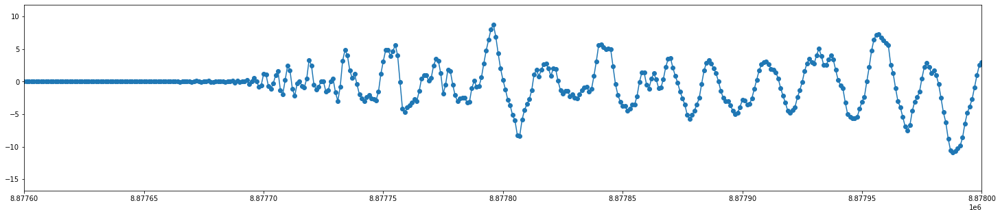

In [35]:
print('Tamanho:' + str(len(recorder.channels[1].data_samples)))
print('Máximo:' + str(max(recorder.channels[1].data_samples)))
print('Mínimo:' + str(min(recorder.channels[1].data_samples)))
plt.figure(figsize=(25, 5))
plt.plot(recorder.channels[1].data_samples, linestyle='-', marker ='o')
plt.xlim(8877600, 8878000)
plt.show()

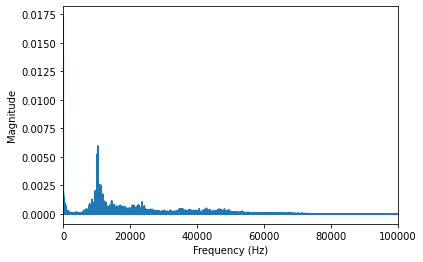

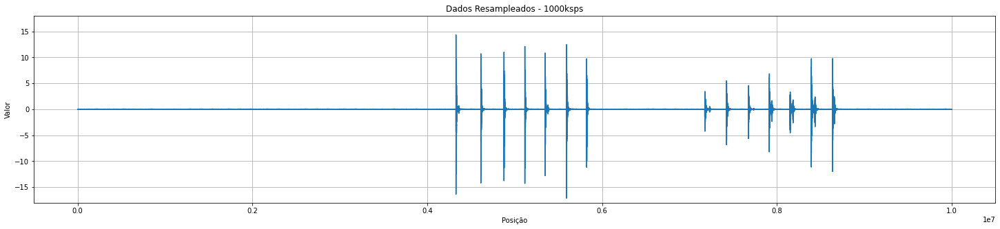

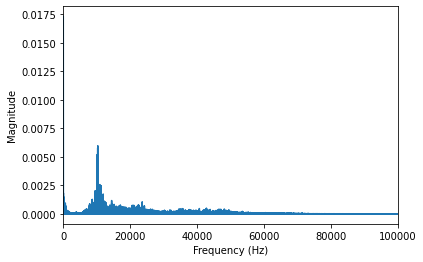

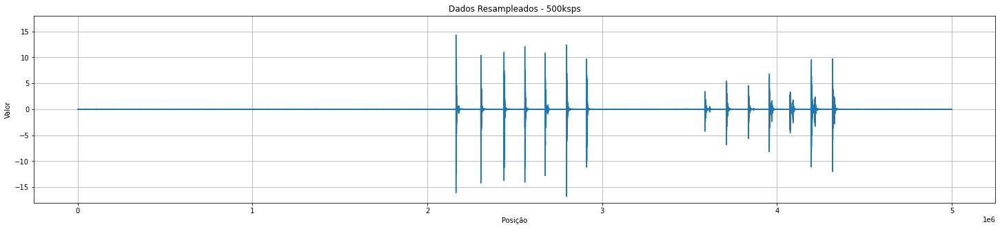

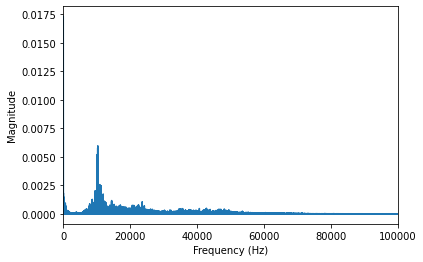

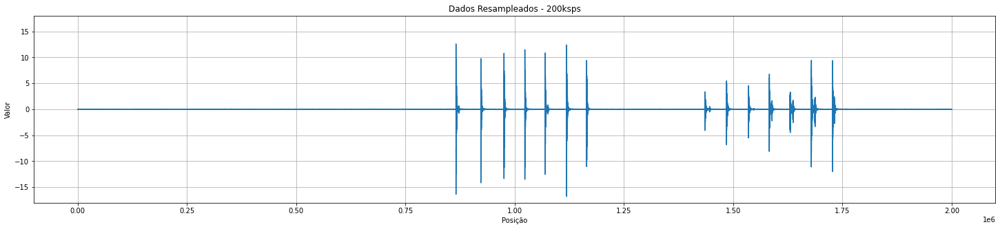

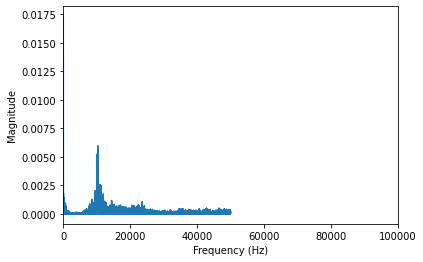

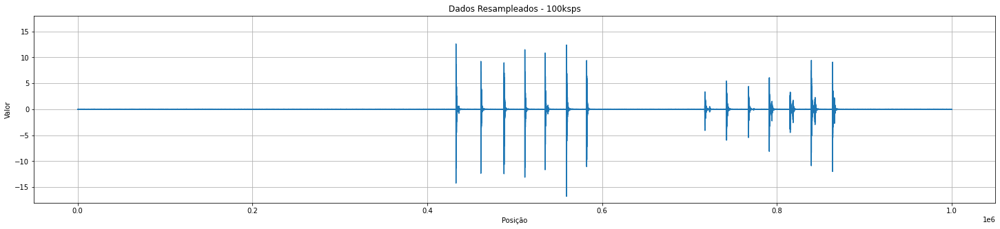

In [45]:
import numpy as np
import pandas as pd

# Frequências de amostragem desejadas
frequencias_amostragem = [1000000, 500000, 200000, 100000]  # 500ksps, 200ksps, 100ksps
channel = 0
inicio = 0 # 8363000
fim = 10000000# 8370000

for freq_amostragem in frequencias_amostragem:
    resampled_data = np.array(recorder.channels[channel].data_samples)[::int(1000000 / freq_amostragem)]

    x_inicio = 0
    if inicio != 0:
        x_inicio = int(freq_amostragem * inicio / 1000000)  # Calcula o índice de início
    x_fim = int(freq_amostragem * fim / 1000000)  # Calcula o índice de fim

    resample_timedelta = pd.Timedelta(1/freq_amostragem, unit='s')
    # Compute FFT and plot the magnitude spectrum
    n = len(resampled_data)
    freq = np.fft.fftfreq(n, d=resample_timedelta.total_seconds())
    fft = np.fft.fft(resampled_data)
    mag_spectrum = np.abs(fft / n)

    plt.figure()
    plt.plot(freq, mag_spectrum)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Magnitude")
    plt.xlim(0,100000)
    # plt.ylim(0,0.00010)
    plt.show()


    plt.figure(figsize=(25, 5))
    plt.plot(resampled_data[x_inicio:x_fim], linestyle='-')  # Usando os índices de fatia corretos
    plt.xlabel('Posição')
    plt.ylabel('Valor')
    plt.title(f'Dados Resampleados - {freq_amostragem // 1000}ksps')
    plt.grid(True)
    plt.ylim(-18, 18)
    plt.show()

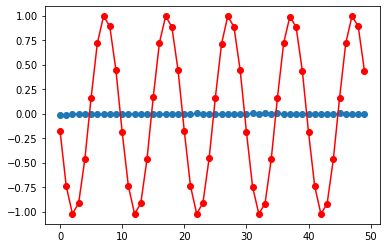

In [6]:
plt.plot(recorder.channels[0].data_samples[0:50], linestyle='-', marker='o')
plt.plot(recorder.channels[1].data_samples[0:50], linestyle='-', marker='o', color='red')

In [51]:
import pandas as pd

data = {
    'Canal 1': recorder.channels[0].data_samples,
    'Canal 2': recorder.channels[1].data_samples,
}

df = pd.DataFrame(data)
df.to_csv('dados.csv', index=False)
df

,Canal 1,Canal 2
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000000,0.000000
...,...,...
9999995,-0.009469,0.010299
9999996,-0.009469,0.010299
9999997,-0.005802,0.006549
9999998,-0.005802,0.010299


In [13]:
import numpy as np

a_load = np.load('G:\Meu Drive\MESTRADO CPGEI\Lactec\dados_linux.npy')
a_load

array([[-0.01680333, -0.02719734],
       [-0.01680333, -0.0234477 ],
       [-0.01680333, -0.0234477 ],
       ...,
       [-0.02413751, -0.01969806],
       [-0.02047042, -0.01969806],
       [-0.02413751, -0.01969806]])

In [12]:
import numpy as np
import zlib

compressed_file_path = r'G:\Meu Drive\MESTRADO CPGEI\Lactec\dados_linux_compressed.npy'

with open(compressed_file_path, 'rb') as compressed_file:
    compressed_data = compressed_file.read()

decompressed_data = zlib.decompress(compressed_data)
decompressed_array = np.frombuffer(decompressed_data, dtype=np.float64) 
decompressed_output_file_path = r'G:\Meu Drive\MESTRADO CPGEI\Lactec\dados_linux_decompressed.npy'
np.save(decompressed_output_file_path, decompressed_array)

print('Decompression complete. Data saved to:', decompressed_output_file_path)

Decompression complete. Data saved to: G:\Meu Drive\MESTRADO CPGEI\Lactec\dados_linux_decompressed.npy


STM32

In [21]:
import serial
import time

# Configure a porta COM6 com a taxa de baud rate e outros parâmetros apropriados
ser = serial.Serial('COM11', baudrate=1000000, timeout=1)

tempo_inicial = time.time()  # Marca o tempo inicial
tempo_limite = 1  # Tempo em segundos para ler os dados

dados_recebidos = b''  # Variável para armazenar os dados recebidos

while (time.time() - tempo_inicial) < tempo_limite:
    linha = ser.read(10000)  # Lê 1000 bytes da porta serial
    if linha:
        dados_recebidos += linha

ser.close()

# Agora, vamos converter os dados binários em números inteiros em pares
elementos = list(dados_recebidos)
resultados = []

# Itera sobre os elementos em pares (cada 2 elementos)
for i in range(0, len(elementos), 2):
    # Converte o primeiro elemento para inteiro
    primeiro_elemento = int(elementos[i])

    # Verifica se há um segundo elemento antes de tentar acessá-lo
    if i + 1 < len(elementos):
        segundo_elemento = int(elementos[i + 1]) * 256
        # Calcula a soma dos elementos
        resultado = primeiro_elemento + segundo_elemento
        # Adiciona o resultado à lista de resultados
        resultados.append(resultado)


print("Número de resultados:", len(resultados))

Número de resultados: 505000


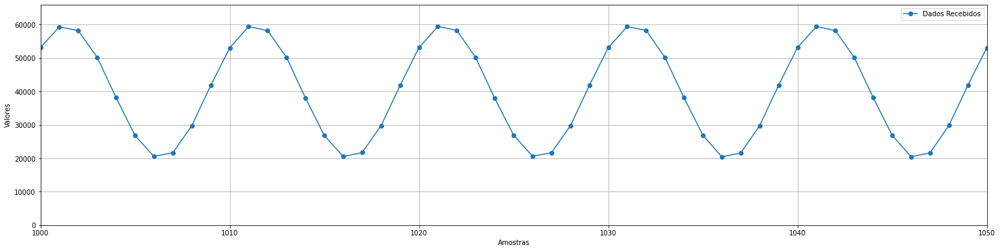

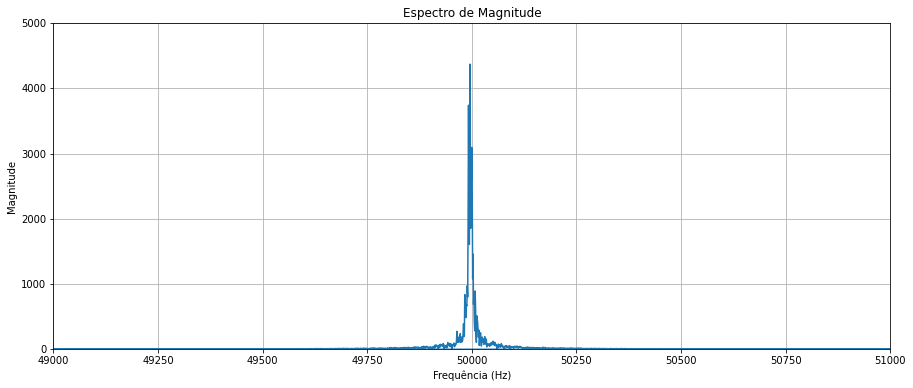

In [22]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Plotar o gráfico
plt.figure(figsize=(25, 6))
plt.plot(resultados, linestyle='-', marker='o', label='Dados Recebidos')
plt.xlabel("Amostras")
plt.ylabel("Valores")
plt.grid(True)
plt.legend()
plt.ylim(0, 66000)  
plt.xlim(1000,1050)
plt.show()

resample_timedelta = pd.Timedelta(1 / 500000, unit='s')
n = len(resultados)
freq = np.fft.fftfreq(n, d=resample_timedelta.total_seconds())
fft = np.fft.fft(resultados)
mag_spectrum = np.abs(fft) / n  # Normalizar pela quantidade de pontos

# Plotar o espectro de magnitude
plt.figure(figsize=(15, 6))
plt.plot(freq, mag_spectrum)
plt.xlabel("Frequência (Hz)")
plt.ylabel("Magnitude")
plt.xlim(49000, 51000)  # Ajuste o limite X conforme necessário
plt.ylim(0, 5000)  # Ajuste o limite Y para mostrar a magnitude máxima
plt.title("Espectro de Magnitude")
plt.grid(True)
plt.show()

Com docklight

In [327]:
import datetime

# Inicialize variáveis para armazenar as datas e horas de início e término
data_hora_inicio = ""
data_hora_termino = ""

# Lista para armazenar os números
numeros = []

# Abra o arquivo para leitura
with open('dados_dec.txt', 'r') as arquivo:
    linhas = arquivo.readlines()

# Percorra as linhas do arquivo
for linha in linhas:
    if "Started" in linha:
        # Encontrou a linha de início, extrai a data e a hora de início
        data_hora_inicio = linha.strip().split(" - ")[1]
    elif "Stopped" in linha:
        # Encontrou a linha de término, extrai a data e a hora de término
        data_hora_termino = linha.strip().split(" - ")[1]
    elif any(char.isdigit() for char in linha):
        # Verifica se a linha contém números (assumindo que os números estão separados por espaços)
        # Extrai os números da linha e os adiciona à lista
        numeros.extend([int(num) for num in linha.split() if num.isdigit()])

# Converte a lista de números em uma única string
numeros_str = ' '.join(map(str, numeros))

# Imprime as datas e horas de início e término
print(data_hora_inicio)
print(data_hora_termino)

# # Converte as datas e horas para objetos datetime
# data_hora_inicio_obj = datetime.datetime.strptime(data_hora_inicio, "%d/%m/%Y %H:%M:%S.%f")
# data_hora_termino_obj = datetime.datetime.strptime(data_hora_termino, "%d/%m/%Y %H:%M:%S.%f")

# # Calcula a diferença de tempo entre as duas datas e horas
# diferenca_de_tempo = data_hora_termino_obj - data_hora_inicio_obj

# # Imprime a diferença de tempo
# print("Diferença de tempo:", diferenca_de_tempo)


# Salva a string de números em um novo arquivo
with open('numeros.txt', 'w') as arquivo_numeros:
    arquivo_numeros.write(numeros_str)


Started 12/09/2023 15:00:32.393
Stopped 12/09/2023 15:00:33.799


In [330]:
# Abre o arquivo em modo de leitura
with open('numeros.txt', 'r') as arquivo:
    # Lê o conteúdo do arquivo
    conteudo = arquivo.read()

# Divide a string em uma lista de elementos usando o espaço como separador
elementos = conteudo.split()

# Inicializa uma lista para armazenar os resultados
resultados = []

# Itera sobre os elementos em pares (cada 2 elementos)
for i in range(0, len(elementos), 2):
    # Converte o primeiro elemento para inteiro
    primeiro_elemento = int(elementos[i])

    # Verifica se há um segundo elemento antes de tentar acessá-lo
    if i + 1 < len(elementos):
        segundo_elemento = int(elementos[i + 1]) * 256
        # Calcula a soma dos elementos
        resultado = primeiro_elemento + segundo_elemento
        # Adiciona o resultado à lista de resultados
        resultados.append(resultado)

# Imprime os resultados
print("Resultados:")
for resultado in resultados:
    print(resultado)

len(resultados)

Resultados:
3771
3522
2855
2103
1463
1230
1495
2154
2915
3551
3758
3507
2869
2081
1443
1262
1520
2168
2942
3552
3773
3504
2858
2078
1464
1260
1530
2206
2965
3551
3775
3483
2843
2067
1453
1267
1524
2206
2967
3580
3753
3486
2839
2054
1439
1262
1549
2217
2977
3576
3771
3464
2805
2015
1423
1252
1544
2208
2983
3584
3768
3475
2811
2032
1445
1258
1562
2231
2962
3571
3788
3468
2800
2033
1448
1264
1571
2238
3003
3605
3771
3463
2751
2001
1419
1247
1569
2234
3016
3612
3763
3441
2791
1947
1449
1272
1585
2275
3039
3605
3769
3441
2762
1980
1418
1260
1595
2281
3047
3636
3746
3451
2758
1970
1404
1244
1590
2280
3048
3616
3761
3424
2738
1963
1394
1250
1587
2295
3067
3629
3747
3423
2722
1943
1386
1267
1631
2321
3088
3647
3755
3398
2704
1929
1389
1269
1633
2350
3094
3647
3786
3353
2691
1932
1384
1285
1630
2349
3099
3652
3735
3381
2702
1910
1370
1266
1658
2363
3124
3655
3741
3380
2658
1893
1369
1280
1655
2386
3125
3633
3724
3359
2656
1892
1365
1280
1671
2387
3136
3665
3749
3367
2626
1876
1375
1282
1689
239

342528

In [329]:
resultados = [1509, 3285, 3511, 1748, 1515, 3293, 3504, 1723, 1529, 3304, 3496, 1709, 1541, 3315, 3485, 1705, 1539, 3329, 3478, 1691, 1555, 3341, 3467, 1680, 1565, 3358, 3455, 1673, 1575, 3364, 3451, 1661, 1586, 3368, 3440, 1648, 1592, 3386, 3436, 1634, 1607, 3392, 3418, 1629, 1610, 3401, 3411, 1619, 1618, 3410, 3403, 1611, 1630, 3417, 3388, 1607, 1637, 3429, 3382, 1597, 1647, 3434, 3373, 1584, 1656, 3446, 3358, 1581, 1669, 3455, 3346, 1570, 1675, 3464, 3346, 1550, 1692, 3477, 3329, 1551, 1698, 3477, 3318, 1539, 1713, 3495, 3309, 1527, 1723, 3502, 3299, 1517, 1732, 3514, 3282, 1513, 1745, 3518, 3272, 1498, 1757, 3531, 3259, 1494, 1768, 3539, 3245, 1485, 1783, 3548, 3234, 1473, 1799, 3562, 3220, 1465, 1808, 3568, 3209, 1457, 1821, 3577, 3200, 1446, 1834, 3588, 3182, 1439, 1847, 3595, 3169, 1418, 1861, 3602, 3158, 1421, 1870, 3613, 3140, 1416, 1888, 3620, 3132, 1405, 1905, 3623, 3117, 1398, 1920, 3634, 3103, 1393, 1937, 3644, 3085, 1378, 1951, 3649, 3072, 1373, 1960, 3658, 3056, 1364, 1982, 3664, 3042, 1359, 1996, 3668, 3025, 1350, 2010, 3679, 3010, 1345, 2025, 3686, 2998, 1340, 2040, 3689, 2986, 1331, 2055, 3688, 2962, 1321, 2072, 3691, 2954, 1321, 2083, 3699, 2937, 1318, 2101, 3704, 2922, 1316]
len(resultados)

200

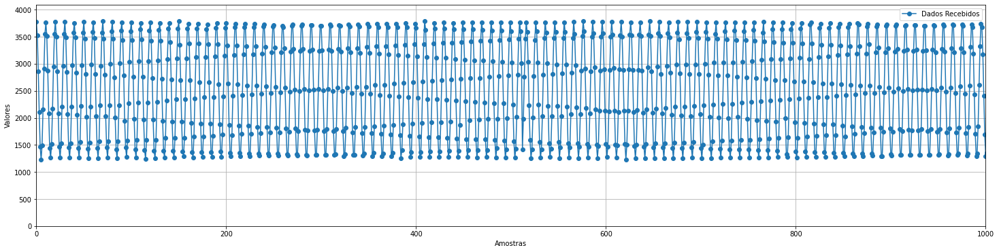

In [332]:
import matplotlib.pyplot as plt

# Plotar o gráfico
plt.figure(figsize=(25, 6))
plt.plot(resultados, linestyle='-', marker='o', label='Dados Recebidos')
plt.xlabel("Amostras")
plt.ylabel("Valores")
plt.grid(True)
plt.legend()
plt.ylim(0, 4095)  
plt.xlim(0,1000)
plt.show()

In [95]:
# Abre o arquivo em modo de leitura
with open('dados_dec.txt', 'r') as arquivo:
    # Lê o conteúdo do arquivo
    conteudo = arquivo.read()

# Divide a string em uma lista de elementos usando o espaço como separador
elementos = conteudo.split()

# Inicializa uma lista para armazenar os resultados
resultados = []

# Itera sobre os elementos em pares (cada 2 elementos)
for i in range(0, len(elementos), 2):
    # Converte o primeiro elemento para inteiro
    primeiro_elemento = int(elementos[i])

    # Verifica se há um segundo elemento antes de tentar acessá-lo
    if i + 1 < len(elementos):
        segundo_elemento = int(elementos[i + 1]) * 256
        # Calcula a soma dos elementos
        resultado = primeiro_elemento + segundo_elemento

        # Verifica se o resultado é maior que 5000
        if resultado > 5000:
            # Se for maior, calcula a média dos 200 resultados anteriores (se houver)
            if len(resultados) >= 10:
                media_anteriores = sum(resultados[-10:]) / 10
                resultados.append(media_anteriores)
            else:
                resultados.append(resultado)
        else:
            resultados.append(resultado)

# Imprime os resultados
print("Resultados:")
for resultado in resultados:
    print(resultado)

len(resultados)


Resultados:
2712
2711
2709
2711
2710
2710
2711
2710
2709
2709
2710
2707
2709
2709
2710
2709
2708
2708
2707
2708
2707
2708
2708
2708
2710
2711
2710
2712
2711
2710
2711
2711
2712
2710
2709
2709
2709
2710
2712
2710
2711
2708
2711
2709
2710
2712
2709
2711
2708
2707
2708
2709
2710
2708
2707
2709
2709
2712
2711
2715
2709
2712
2709
2713
2711
2710
2712
2711
2710
2710
2709
2710
2711
2710
2709
2711
2707
2710
2709
2710
2711
2711
2711
2711
2711
2711
2710
2711
2710
2709
2711
2708
2710
2710
2710
2709
2709
2710
2708
2709
2709
2710
2709
2709
2712
2711
2711
2711
2711
2710
2710
2710
2707
2707
2709
2709
2709
2707
2708
2709
2707
2706
2711
2707
2710
2706
2707
2708
2711
2707
2710
2709
2710
2710
2709
2709
2711
2710
2709
2711
2709
2712
2711
2710
2709
2710
2709
2709
2711
2710
2709
2709
2710
2709
2710
2709
2710
2711
2710
2711
2711
2709
2709
2710
2711
2710
2710
2708
2709
2712
2709
2710
2711
2709
2711
2709
2711
2709
2710
2709
2710
2708
2710
2712
2708
2708
2707
2712
2709
2705
2715
2714
2701
2707
2710
2710
2710
271

183864

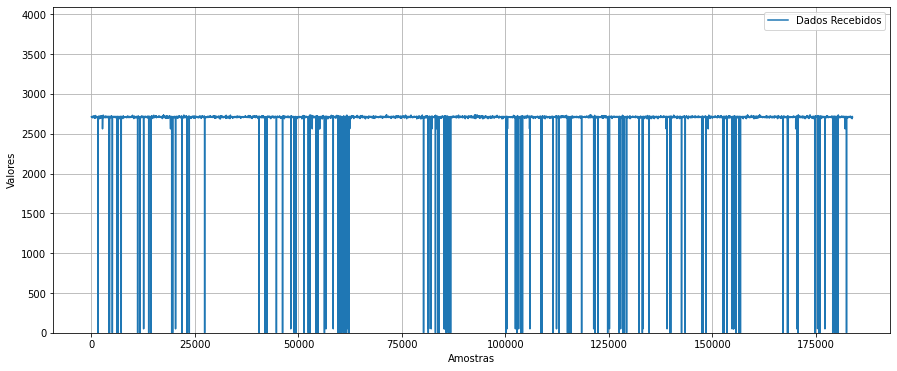

In [96]:
import matplotlib.pyplot as plt

# Plotar o gráfico
plt.figure(figsize=(15, 6))
plt.plot(resultados, linestyle='-', label='Dados Recebidos')
plt.xlabel("Amostras")
plt.ylabel("Valores")
plt.grid(True)
plt.legend()
plt.ylim(0, 4095)  
plt.show()

In [159]:
# Abre o arquivo em modo de leitura
with open('dados_dec.txt', 'r') as arquivo:
    # Lê o conteúdo do arquivo
    conteudo = arquivo.read()

# Divide a string em uma lista de elementos usando o espaço como separador
elementos = conteudo.split()

# Inicializa uma lista para armazenar os resultados
resultados = []

# Tamanho da janela do filtro de média móvel (ajuste conforme necessário)
tamanho_janela = 10

# Itera sobre os elementos em pares (cada 2 elementos)
for i in range(0, len(elementos), 2):
    # Converte o primeiro elemento para inteiro
    primeiro_elemento = int(elementos[i])

    # Verifica se há um segundo elemento antes de tentar acessá-lo
    if i + 1 < len(elementos):
        segundo_elemento = int(elementos[i + 1]) * 256
        # Calcula a soma dos elementos
        resultado = primeiro_elemento + segundo_elemento

        # Verifica se o resultado está fora da média das últimas "tamanho_janela" amostras
        if len(resultados) >= tamanho_janela:
            media_ultimas_amostras = sum(resultados[-tamanho_janela:]) / tamanho_janela
            if resultado > media_ultimas_amostras + 20 or resultado < media_ultimas_amostras - 20:
                # Se estiver fora da média, substitui pelo valor da média
                resultado = media_ultimas_amostras

        resultados.append(resultado)

# Imprime os resultados
print("Resultados:")
for resultado in resultados:
    print(resultado)

len(resultados)


Resultados:
2300
2257
1867
1687
1573
1449
1668
1895
2279
2406
1938.1
1901.9099999999999
1866.4009999999998
1866.3411
1884.2752100000002
1915.4027310000001
1962.0430041
1991.4473045099999
2001.0920349609999
1973.3012384570998
1930.03136230281
1929.2244985330908
1931.9559483864002
1938.51144322504
1945.7284775475443
1951.8738043022986
1955.5209116325284
1954.8687023857813
1951.2108421733592
1946.222722894595
1943.5148713383448
1944.8632222418983
1946.4270946127792
1947.8742092354173
1948.810485836455
1949.1186866653456
1948.8431749016504
1948.1754012285624
1947.5060711128408
1947.1355940067892
1947.2268811180081
1947.5980820959746
1947.8715680813825
1948.0160154282428
1948.0301960475251
1947.9521670686322
1947.8355151089606
1947.7347491296919
1947.6906839198048
1947.709145200501
1947.7665003198722
1947.8204622400585
1947.8427002544672
1947.8398134717759
1947.8221932761292
1947.8013929989895
1947.7863155920252
1947.7813956403315
1947.7860602913956
1947.7955979285548
1947.8042432013601
194

34465

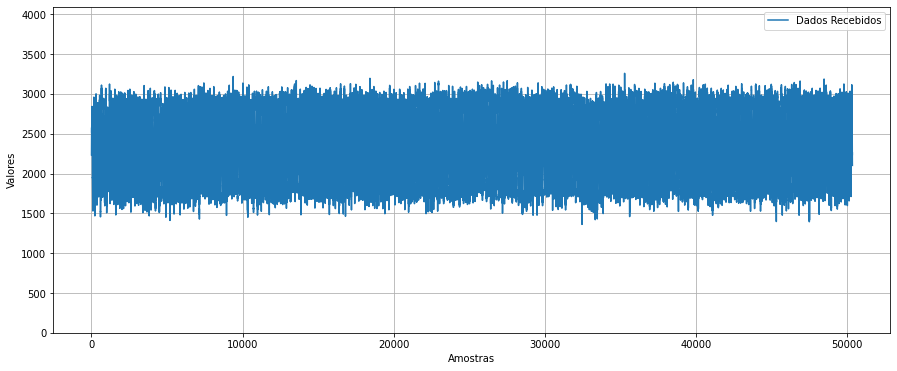

In [168]:
import matplotlib.pyplot as plt

# Plotar o gráfico
plt.figure(figsize=(15, 6))
plt.plot(resultados, linestyle='-', label='Dados Recebidos')
plt.xlabel("Amostras")
plt.ylabel("Valores")
plt.grid(True)
plt.legend()
plt.ylim(0, 4095)  
plt.show()